# Data Inspection

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import preprocessing
import statsmodels.api as sm
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import LabelEncoder
import statsmodels.api as sm


In [4]:
# ignore statsmodels warnings
import warnings
warnings.filterwarnings("ignore")

### 1.Data Loading & Inspection

In [5]:

file_path = "D:\\4DATA\SEMESTER2\PI\DATASET\mm-5G.csv" 
dataset = pd.read_csv(file_path, sep=',')



In [6]:
dataset.head()

,run_num,seq_num,abstractSignalStr,latitude,longitude,movingSpeed,compassDirection,nrStatus,lte_rssi,lte_rsrp,lte_rsrq,lte_rssnr,nr_ssRsrp,nr_ssRsrq,nr_ssSinr,Throughput,mobility_mode,trajectory_direction,tower_id
0,1,1.0,2,44.975314,-93.259316,0.094889,150,NOT_RESTRICTED,-61.0,-94,-14.0,2.147484e+09,NaN,NaN,NaN,78,driving,CW,16
1,1,2.0,2,44.975311,-93.259311,0.876634,117,NOT_RESTRICTED,-61.0,-94,-14.0,2.147484e+09,NaN,NaN,NaN,117,driving,CW,16
2,1,3.0,2,44.975305,-93.259292,2.225798,113,NOT_RESTRICTED,-61.0,-94,-14.0,2.147484e+09,NaN,NaN,NaN,110,driving,CW,16
3,1,4.0,2,44.975293,-93.259258,3.180726,114,NOT_RESTRICTED,-59.0,-95,-16.0,2.147484e+09,NaN,NaN,NaN,108,driving,CW,16
4,1,5.0,2,44.975278,-93.259214,3.751234,115,NOT_RESTRICTED,-59.0,-95,-16.0,2.147484e+09,NaN,NaN,NaN,100,driving,CW,16


In [7]:
dataset.tail()

,run_num,seq_num,abstractSignalStr,latitude,longitude,movingSpeed,compassDirection,nrStatus,lte_rssi,lte_rsrp,lte_rsrq,lte_rssnr,nr_ssRsrp,nr_ssRsrq,nr_ssSinr,Throughput,mobility_mode,trajectory_direction,tower_id
68113,118,779.0,1,44.975063,-93.259101,1.011944,42,NOT_RESTRICTED,-57.0,-91,-16.0,2.147484e+09,NaN,NaN,NaN,125,walking,ACW,10
68114,118,780.0,1,44.975067,-93.259098,0.906543,42,NOT_RESTRICTED,-57.0,-91,-16.0,2.147484e+09,NaN,NaN,NaN,105,walking,ACW,10
68115,118,781.0,1,44.975069,-93.259099,0.751355,41,NOT_RESTRICTED,-57.0,-91,-16.0,2.147484e+09,NaN,NaN,NaN,92,walking,ACW,10
68116,118,782.0,1,44.975071,-93.259099,0.656095,39,NOT_RESTRICTED,-57.0,-91,-16.0,2.147484e+09,NaN,NaN,NaN,87,walking,ACW,10
68117,118,783.0,1,44.975073,-93.259100,0.568798,38,CONNECTED,-57.0,-91,-16.0,2.147484e+09,-87.0,-12.0,6.0,137,walking,ACW,10


In [8]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 68118 entries, 0 to 68117
Data columns (total 19 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   run_num               68118 non-null  int64  
 1   seq_num               68118 non-null  float64
 2   abstractSignalStr     68118 non-null  int64  
 3   latitude              68118 non-null  float64
 4   longitude             68118 non-null  float64
 5   movingSpeed           68118 non-null  float64
 6   compassDirection      68118 non-null  int64  
 7   nrStatus              68118 non-null  object 
 8   lte_rssi              65137 non-null  float64
 9   lte_rsrp              68118 non-null  int64  
 10  lte_rsrq              65137 non-null  float64
 11  lte_rssnr             65137 non-null  float64
 12  nr_ssRsrp             51990 non-null  float64
 13  nr_ssRsrq             51990 non-null  float64
 14  nr_ssSinr             51990 non-null  float64
 15  Throughput         

In [9]:
dataset.describe()

,run_num,seq_num,abstractSignalStr,latitude,longitude,movingSpeed,compassDirection,lte_rssi,lte_rsrp,lte_rsrq,lte_rssnr,nr_ssRsrp,nr_ssRsrq,nr_ssSinr,Throughput,tower_id
count,68118.000000,68118.000000,68118.000000,68118.000000,68118.000000,6.811800e+04,68118.000000,65137.000000,68118.000000,65137.000000,6.513700e+04,51990.000000,5.199000e+04,51990.000000,68118.000000,68118.000000
mean,57.913635,351.161910,3.934628,44.975189,-93.261352,1.862048e+00,177.688731,-55.456054,-83.705849,-12.571626,2.147484e+09,-89.070917,3.696859e+07,11.653530,520.665184,13.522681
std,34.313850,233.902358,0.927087,0.000987,0.001205,1.857597e+00,101.751416,7.799077,18.040661,3.498149,0.000000e+00,8.366524,2.793283e+08,6.323822,461.941862,5.694595
min,1.000000,1.000000,1.000000,44.973256,-93.263754,6.212357e-12,0.000000,-79.000000,-140.000000,-20.000000,2.147484e+09,-139.000000,-2.000000e+01,-20.000000,0.000000,1.000000
25%,28.000000,145.000000,3.000000,44.974377,-93.262263,1.236203e+00,114.000000,-57.000000,-90.000000,-15.000000,2.147484e+09,-94.000000,-1.200000e+01,8.000000,109.000000,11.000000
50%,53.000000,318.000000,4.000000,44.975318,-93.261321,1.354527e+00,184.000000,-51.000000,-79.000000,-12.000000,2.147484e+09,-89.000000,-1.200000e+01,14.000000,424.000000,16.000000
75%,88.000000,555.000000,5.000000,44.975978,-93.260409,1.464417e+00,295.000000,-51.000000,-75.000000,-10.000000,2.147484e+09,-83.000000,-1.200000e+01,17.000000,867.000000,16.000000
max,118.000000,800.000000,5.000000,44.976964,-93.258991,1.405988e+01,360.000000,-51.000000,-44.000000,-5.000000,2.147484e+09,-68.000000,2.147484e+09,30.000000,1920.000000,24.000000


In [10]:
print("\nMissing Values:")
dataset.isnull().sum()


Missing Values:


run_num                     0
seq_num                     0
abstractSignalStr           0
latitude                    0
longitude                   0
movingSpeed                 0
compassDirection            0
nrStatus                    0
lte_rssi                 2981
lte_rsrp                    0
lte_rsrq                 2981
lte_rssnr                2981
nr_ssRsrp               16128
nr_ssRsrq               16128
nr_ssSinr               16128
Throughput                  0
mobility_mode               0
trajectory_direction        0
tower_id                    0
dtype: int64

### 2. Data Distribution and preparation

 #### 2.1. viewing throughput variation for the five first runs (Sessions)

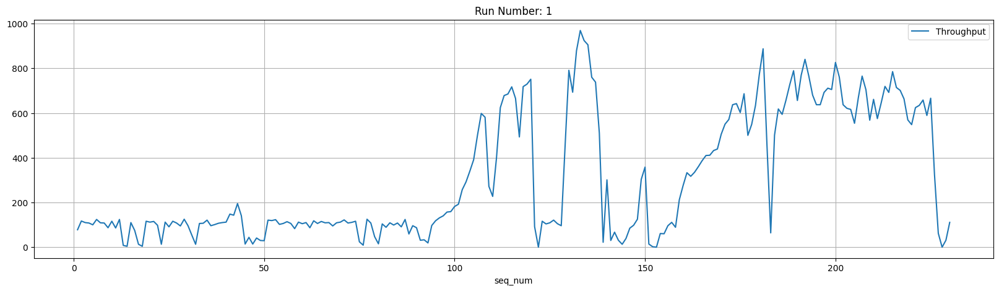

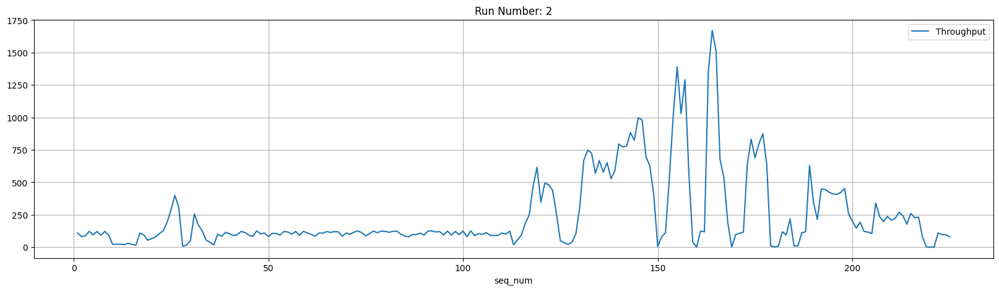

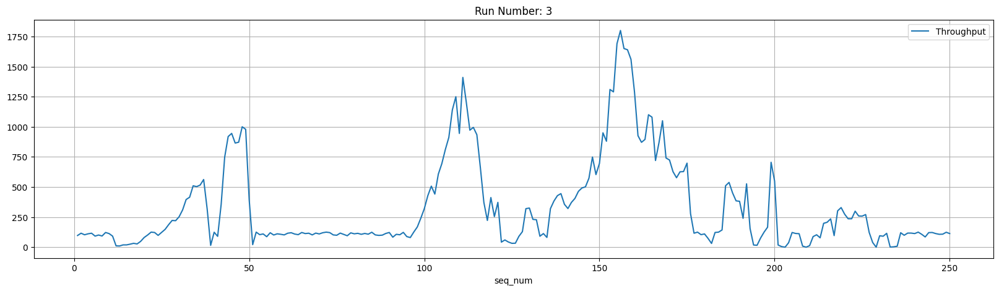

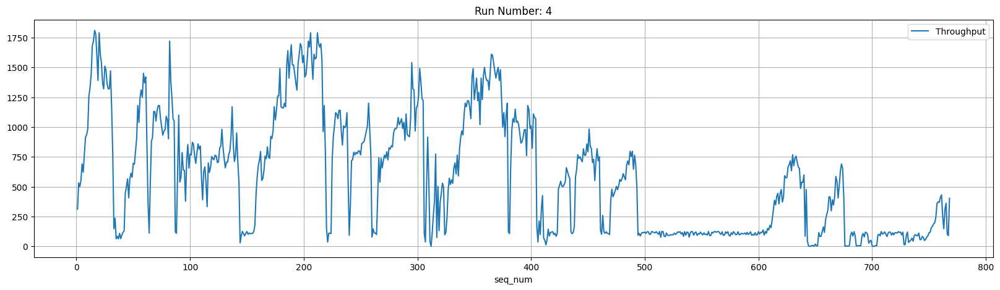

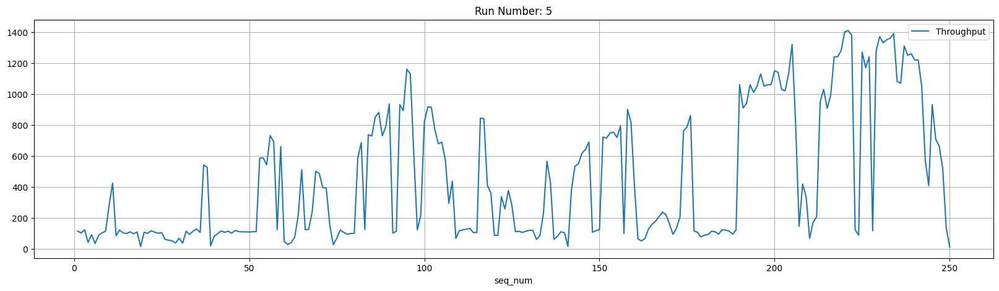

In [11]:
for run_number in range(1, 6):
    run = dataset.loc[(dataset['run_num'] == run_number)][["seq_num", "Throughput"]]
    run = run.set_index("seq_num")
    ax = run.plot(figsize=(20, 5), x_compat=True, grid=True)
    ax.set_title(f"Run Number: {run_number}")


### 2.2. Throughtput Plot


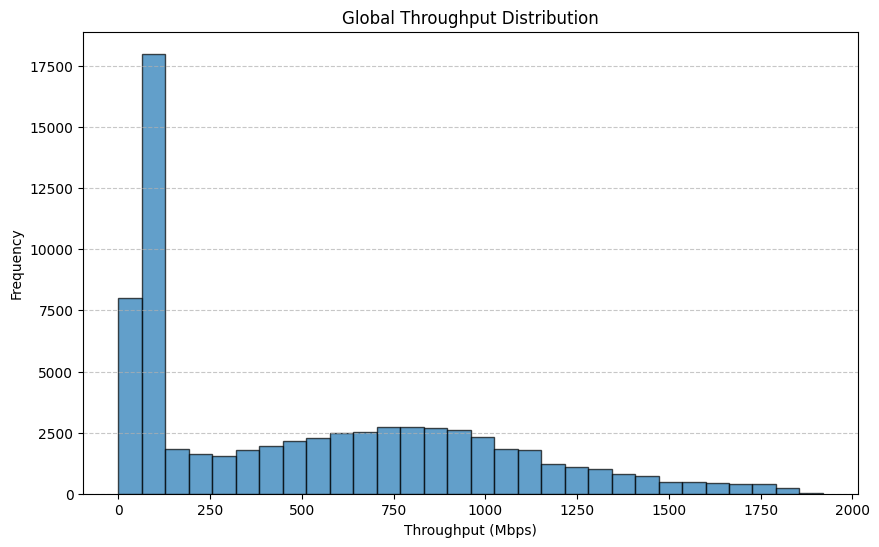

In [12]:
# Plot histogram of global throughput distribution
plt.figure(figsize=(10, 6))
plt.hist(dataset['Throughput'], bins=30, edgecolor="black", alpha=0.7)

plt.xlabel("Throughput (Mbps)")
plt.ylabel("Frequency")
plt.title("Global Throughput Distribution")
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


### 2.3. Encoding non numeric features for further analysis

In [13]:
# dataset est le DataFrame contenant les données à encoder

# 1. Encoder la colonne 'trajectory_direction'
directions = list(dataset['trajectory_direction'].unique())
print('Directions:', directions)
enc = preprocessing.LabelEncoder()
dataset['trajectory_direction'] = enc.fit_transform(dataset['trajectory_direction'].values.ravel())

# 2. Encoder la colonne 'mobility_mode'
mobility_mode = list(dataset['mobility_mode'].unique())
print('Mobility mode:', mobility_mode)
enc = preprocessing.LabelEncoder()
dataset['mobility_mode'] = enc.fit_transform(dataset['mobility_mode'].values.ravel())

# 3. Encoder la colonne 'nrStatus'
nrStatus = list(dataset['nrStatus'].unique())
print('nrStatus:', nrStatus)
enc = preprocessing.LabelEncoder()
dataset['nrStatus'] = enc.fit_transform(dataset['nrStatus'].values.ravel())

# Afficher les premières lignes du DataFrame pour vérifier
dataset.head()


Directions: ['CW', 'ACW']
Mobility mode: ['driving', 'walking']
nrStatus: ['NOT_RESTRICTED', 'CONNECTED', 'NONE']


,run_num,seq_num,abstractSignalStr,latitude,longitude,movingSpeed,compassDirection,nrStatus,lte_rssi,lte_rsrp,lte_rsrq,lte_rssnr,nr_ssRsrp,nr_ssRsrq,nr_ssSinr,Throughput,mobility_mode,trajectory_direction,tower_id
0,1,1.0,2,44.975314,-93.259316,0.094889,150,2,-61.0,-94,-14.0,2.147484e+09,NaN,NaN,NaN,78,0,1,16
1,1,2.0,2,44.975311,-93.259311,0.876634,117,2,-61.0,-94,-14.0,2.147484e+09,NaN,NaN,NaN,117,0,1,16
2,1,3.0,2,44.975305,-93.259292,2.225798,113,2,-61.0,-94,-14.0,2.147484e+09,NaN,NaN,NaN,110,0,1,16
3,1,4.0,2,44.975293,-93.259258,3.180726,114,2,-59.0,-95,-16.0,2.147484e+09,NaN,NaN,NaN,108,0,1,16
4,1,5.0,2,44.975278,-93.259214,3.751234,115,2,-59.0,-95,-16.0,2.147484e+09,NaN,NaN,NaN,100,0,1,16


## Classification of features 

In [14]:
# Step 1: Classify throughput into Low, Medium, High based on throughput values
def classify_throughput(throughput):
    if throughput < 100:
        return 'Low'
    elif throughput < 500:
        return 'Medium'
    else:
        return 'High'

# Step 2: Classify walking into Indoor or Outdoor based on movingSpeed and GPS movement
def classify_walking(row):
    # If moving speed is very low and GPS movement is minimal, it's indoor walking
    if row['movingSpeed'] < 5 and row['gps_diff'] < 0.05:
        return 'Indoor Walking'
    else:
        return 'Outdoor Walking'

# Create gps_diff to help determine indoor vs outdoor walking
dataset['gps_diff'] = dataset[['latitude', 'longitude']].diff().sum(axis=1)  # Simple diff-based heuristic for GPS movement

# Step 3: Apply classification to throughput
dataset['throughput_class'] = dataset['Throughput'].apply(classify_throughput)

# Step 4: Apply classification for mobility mode (Walking: Indoor/Outdoor, Driving: unchanged)
dataset['mobility_mode_classified'] = dataset.apply(lambda row: classify_walking(row) if row['mobility_mode'] == 'walking' else 'Driving', axis=1)

# Step 5: Encode throughput classes (Low: 0, Medium: 1, High: 2)
label_encoder = LabelEncoder()
dataset['throughput_class_encoded'] = label_encoder.fit_transform(dataset['throughput_class'])

# Step 6: Encode mobility mode (Indoor Walking: 0, Outdoor Walking: 1, Driving: 2)
dataset['mobility_mode_encoded'] = label_encoder.fit_transform(dataset['mobility_mode_classified'])

dataset.head()

,run_num,seq_num,abstractSignalStr,latitude,longitude,movingSpeed,compassDirection,nrStatus,lte_rssi,lte_rsrp,...,nr_ssSinr,Throughput,mobility_mode,trajectory_direction,tower_id,gps_diff,throughput_class,mobility_mode_classified,throughput_class_encoded,mobility_mode_encoded
0,1,1.0,2,44.975314,-93.259316,0.094889,150,2,-61.0,-94,...,NaN,78,0,1,16,0.000000,Low,Driving,1,0
1,1,2.0,2,44.975311,-93.259311,0.876634,117,2,-61.0,-94,...,NaN,117,0,1,16,0.000003,Medium,Driving,2,0
2,1,3.0,2,44.975305,-93.259292,2.225798,113,2,-61.0,-94,...,NaN,110,0,1,16,0.000012,Medium,Driving,2,0
3,1,4.0,2,44.975293,-93.259258,3.180726,114,2,-59.0,-95,...,NaN,108,0,1,16,0.000023,Medium,Driving,2,0
4,1,5.0,2,44.975278,-93.259214,3.751234,115,2,-59.0,-95,...,NaN,100,0,1,16,0.000028,Medium,Driving,2,0


## BoxPlot for the Throughput

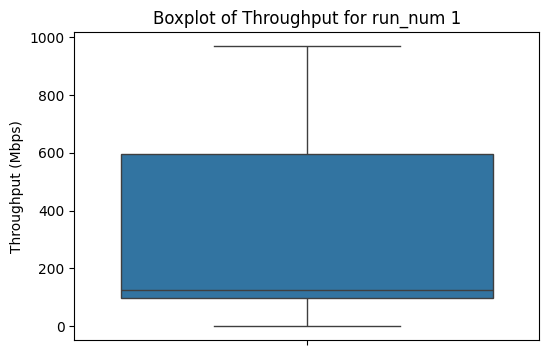

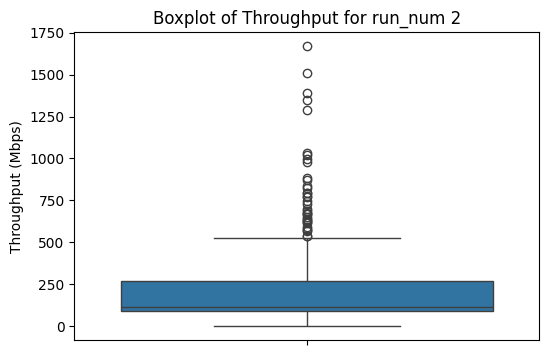

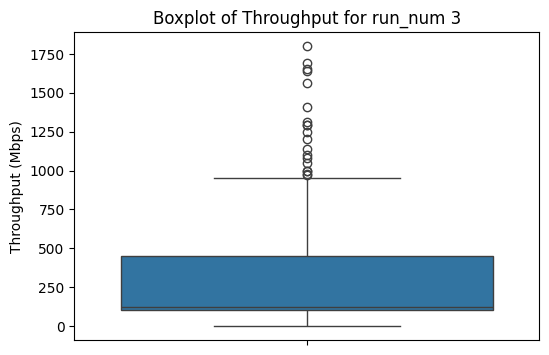

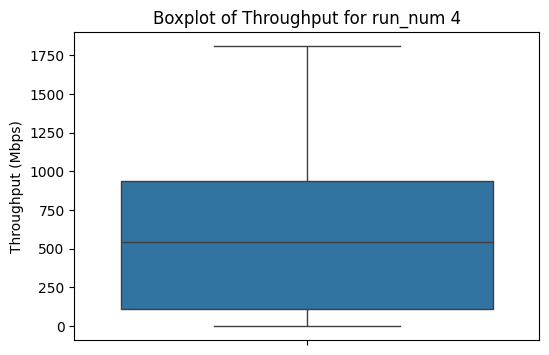

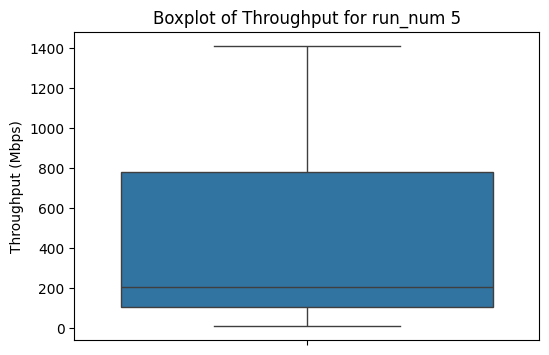

...

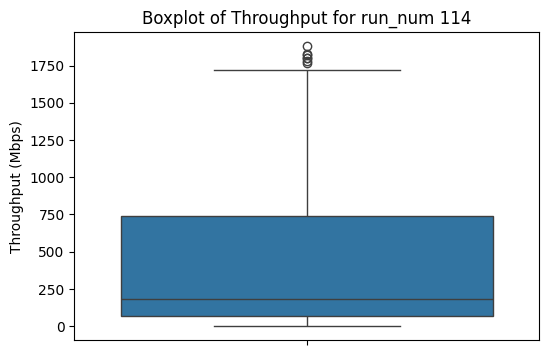

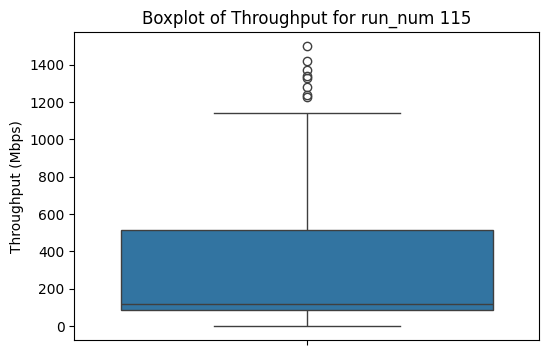

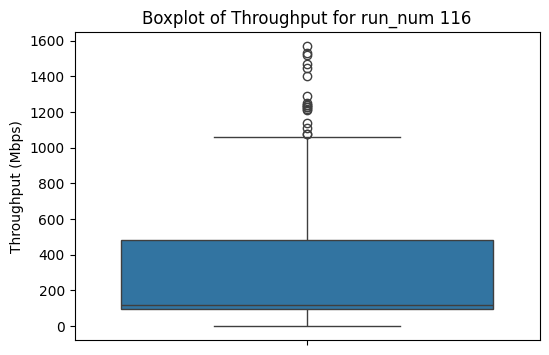

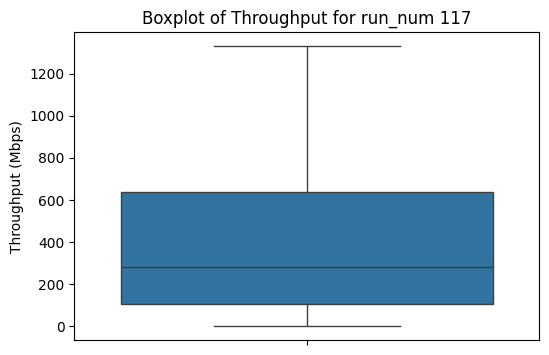

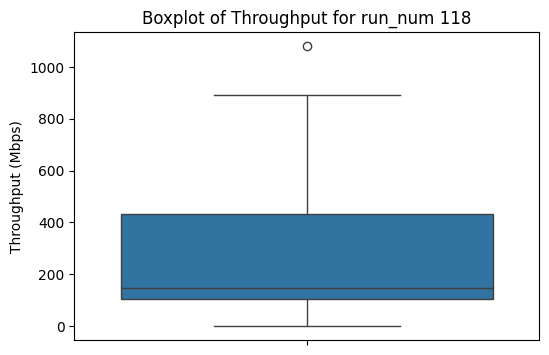

In [15]:

# Liste des run_num uniques
run_nums = dataset["run_num"].unique()

# Créer un boxplot pour chaque run_num
for run in run_nums:
    plt.figure(figsize=(6, 4))
    sns.boxplot(y=dataset[dataset["run_num"] == run]["Throughput"])
    
    # Ajouter titre et labels
    plt.title(f"Boxplot of Throughput for run_num {run}")
    plt.ylabel("Throughput (Mbps)")
    
    # Afficher le graphique
    plt.show()

## BoxPlot for all the features

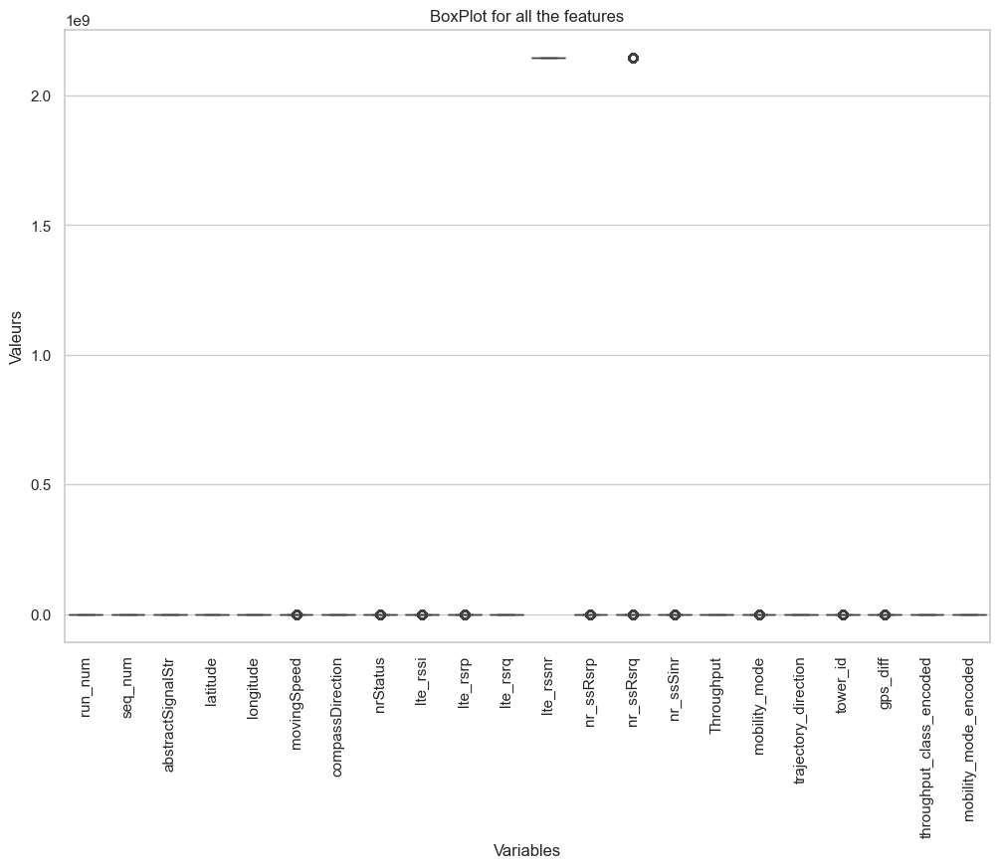

In [16]:
# Définir le style pour une meilleure visualisation
sns.set(style="whitegrid")

# Sélectionner uniquement les variables numériques
numerical_features = dataset.select_dtypes(include=["number"])

# Créer le boxplot pour toutes les variables numériques
plt.figure(figsize=(12, 8))
sns.boxplot(data=numerical_features)

# Ajouter un titre et des labels
plt.title("BoxPlot for all the features")
plt.xlabel("Variables")
plt.ylabel("Valeurs")

# Rotation verticale des labels pour une meilleure lisibilité
plt.xticks(rotation=90)

# Afficher le graphique
plt.show()

### 2.4. Handling Missing values

<span style="color:red">The missing values indicate no signal reception, not a computational error.  signal metrics are only recorded when a connection exists. Replacing them with 0 correctly represents out-of-coverage areas.</span>


In [17]:
# Remplacer les valeurs manquantes (NaN) par 0 dans tout le dataset
dataset = dataset.fillna(0)

# Afficher les premières lignes pour vérifier que les valeurs manquantes ont été remplacées
dataset.head()


,run_num,seq_num,abstractSignalStr,latitude,longitude,movingSpeed,compassDirection,nrStatus,lte_rssi,lte_rsrp,...,nr_ssSinr,Throughput,mobility_mode,trajectory_direction,tower_id,gps_diff,throughput_class,mobility_mode_classified,throughput_class_encoded,mobility_mode_encoded
0,1,1.0,2,44.975314,-93.259316,0.094889,150,2,-61.0,-94,...,0.0,78,0,1,16,0.000000,Low,Driving,1,0
1,1,2.0,2,44.975311,-93.259311,0.876634,117,2,-61.0,-94,...,0.0,117,0,1,16,0.000003,Medium,Driving,2,0
2,1,3.0,2,44.975305,-93.259292,2.225798,113,2,-61.0,-94,...,0.0,110,0,1,16,0.000012,Medium,Driving,2,0
3,1,4.0,2,44.975293,-93.259258,3.180726,114,2,-59.0,-95,...,0.0,108,0,1,16,0.000023,Medium,Driving,2,0
4,1,5.0,2,44.975278,-93.259214,3.751234,115,2,-59.0,-95,...,0.0,100,0,1,16,0.000028,Medium,Driving,2,0


#### Comparative Correlation Analysis of Network Parameters Across Different Runs

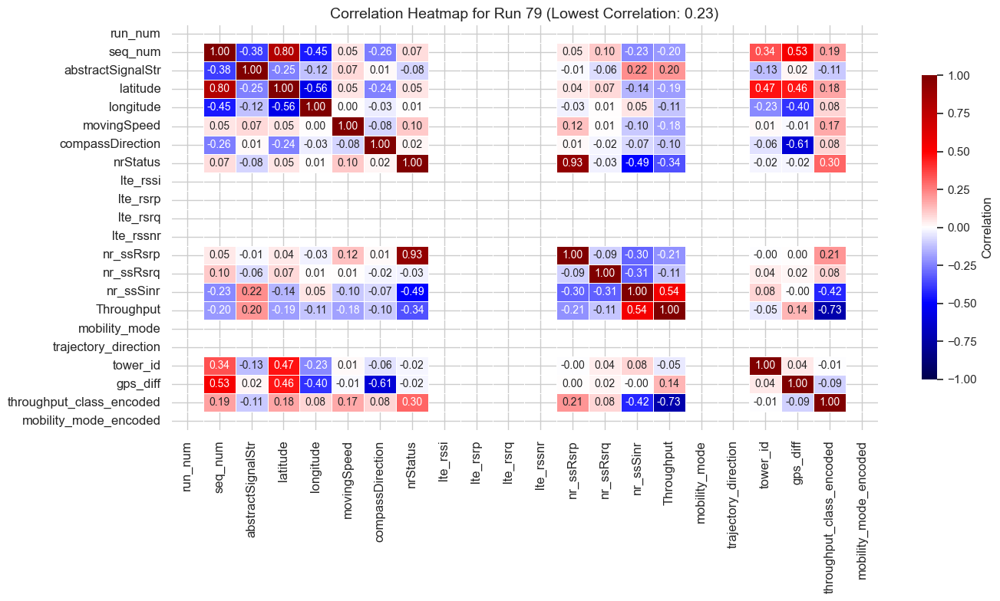

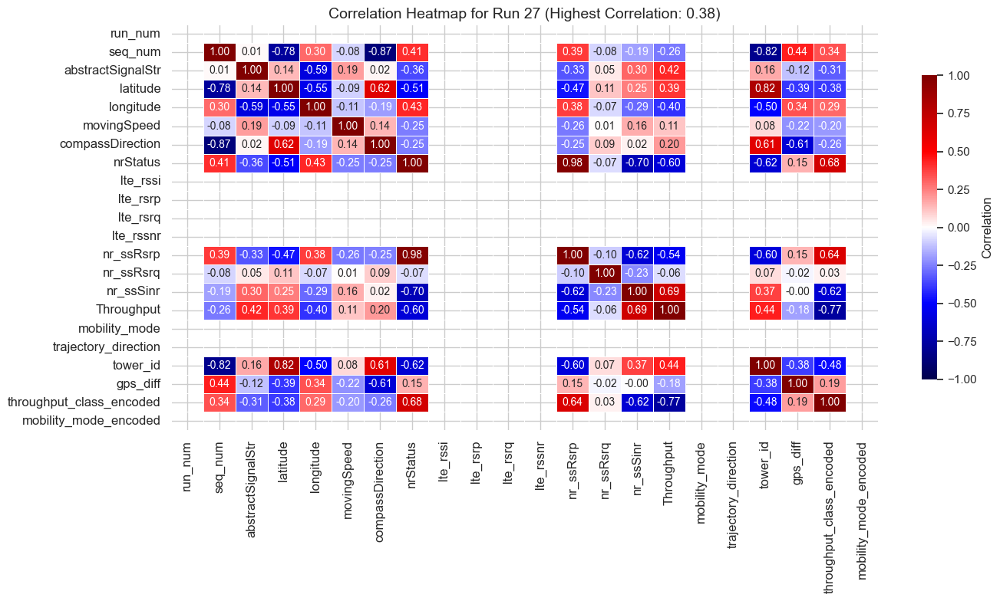

(np.int64(79), np.int64(27))

In [18]:
# Compute correlation matrices for all runs
run_correlation_matrices = {}

# Iterate over unique runs and compute correlation matrix
for run in dataset['run_num'].unique():
    dataset_run = dataset[dataset['run_num'] == run].select_dtypes(include=['number'])
    if not dataset_run.empty:
        run_correlation_matrices[run] = dataset_run.corr()

# Compute the mean correlation values for each run to identify the most different ones
run_mean_correlations = {
    run: np.abs(corr_matrix).mean().mean() for run, corr_matrix in run_correlation_matrices.items()
}

# Select the two runs with the most different mean correlation values
sorted_runs = sorted(run_mean_correlations.items(), key=lambda x: x[1])
low_correlation_run = sorted_runs[0][0]  # Run with the lowest mean correlation
high_correlation_run = sorted_runs[-1][0]  # Run with the highest mean correlation

# Function to plot a heatmap with enhanced readability and vertical X-axis labels
def plot_correlation_heatmap(corr_matrix, run_number, correlation_value, title_suffix):
    plt.figure(figsize=(14, 8))
    sns.heatmap(
        corr_matrix,
        annot=True,
        cmap="seismic",
        fmt=".2f",
        linewidths=0.5,
        vmin=-1, vmax=1,
        cbar_kws={"shrink": 0.75, "label": "Correlation"},
        annot_kws={"size": 10}
    )
    plt.xticks(rotation=90, ha="center", fontsize=12)  # Make X-axis labels vertical
    plt.yticks(fontsize=12)
    plt.title(f"Correlation Heatmap for Run {run_number} ({title_suffix} Correlation: {correlation_value:.2f})", fontsize=14)
    plt.tight_layout()
    plt.show()

# Plot correlation heatmap for the low-correlation run
plot_correlation_heatmap(run_correlation_matrices[low_correlation_run], low_correlation_run, run_mean_correlations[low_correlation_run], "Lowest")

# Plot correlation heatmap for the high-correlation run
plot_correlation_heatmap(run_correlation_matrices[high_correlation_run], high_correlation_run, run_mean_correlations[high_correlation_run], "Highest")

# Return the two selected runs
low_correlation_run, high_correlation_run


## Interpretation :

 <span style="color:red;">--> Correlation varies significantly across runs, reinforcing that throughput is not always directly linked to signal strength.
 
 </span>
<span style="color:red;">--> Mobility, interference, and congestion can weaken correlations, leading to unpredictable throughput patterns.</span>



## EDA CONCLUSION : 

<span style="color:red;">--> Given the high fluctuations in throughput influenced by mobility, signal strength, and network conditions, a rolling window forecasting approach is essential to capture short-term dependencies rather than relying on static correlations. This ensures our model accounts for handover effects, congestion variations, and environmental factors that impact throughput dynamically.</span>


# Export the new dataset

In [19]:
# Define output path
output_file_path = "D:\\4DATA\\SEMESTER2\\PI\\DATASET\\mmwaves.csv"

# Save the dataset
dataset.to_csv(output_file_path, index=False)

print(f"Dataset successfully saved to {output_file_path}")

Dataset successfully saved to D:\4DATA\SEMESTER2\PI\DATASET\mmwaves.csv


In [20]:

file_path = "D:\\4DATA\\SEMESTER2\\PI\\DATASET\\mmwaves.csv"

# Load the dataset without setting an index
dataset = pd.read_csv(file_path, index_col=['run_num', 'seq_num'])

In [21]:
dataset=dataset[["Throughput"]]
dataset.head(10)

Throughput
run_num seq_num            
1       1.0              78
        2.0             117
        3.0             110
        4.0             108
        5.0             100
        6.0             124
        7.0             109
        8.0             108
        9.0              87
        10.0            116

In [22]:
max_throughput = dataset["Throughput"].max()
min_throughput = dataset["Throughput"].min()
print(f'Max throughput: {max_throughput}')
print(f'Min throughput: {min_throughput}')

Max throughput: 1920
Min throughput: 0


# Data Scaling

In [23]:
# Min-Max Scaling
dataset=(dataset-dataset.min())/(dataset.max()-dataset.min())
dataset.head(10)

Throughput
run_num seq_num            
1       1.0        0.040625
        2.0        0.060937
        3.0        0.057292
        4.0        0.056250
        5.0        0.052083
        6.0        0.064583
        7.0        0.056771
        8.0        0.056250
        9.0        0.045312
        10.0       0.060417

##  Create Train-Test Sets

In [24]:
# split function into sequences
def multistep_split(seq, n_steps_in, n_steps_out):
    X = list()
    y = list()
    for i in range(len(seq)):
        # pattern end
        end_ix = i + n_steps_in
        out_end_ix = end_ix + n_steps_out
        if out_end_ix > len(seq):
            break
        seq_x = seq[i:end_ix]
        seq_y = seq[end_ix:out_end_ix, -1]
        X.append(seq_x)
        y.append(seq_y)
    return np.array(X), np.array(y)

In [25]:
# separately splits runs into sequences
run_max=dataset.index.max()[0]
seconds_in = 20
seconds_out = 10
X_list = list()
y_list = list()
for run_num in range(1, run_max+1):
    run = dataset.loc[run_num].values
    X, y = multistep_split(run.astype('float32'), n_steps_in=seconds_in, n_steps_out=seconds_out)
    X_list.append(X)
    y_list.append(y)
X = np.concatenate(X_list)
y = np.concatenate(y_list)
print(X.shape)
print(y.shape)

(64696, 20, 1)
(64696, 10)


In [26]:
# reshape into 2D
X = X.reshape((X.shape[0], X.shape[1]))
X.shape

(64696, 20)

## Train-Test Split for Time Series

In [27]:
ratio=0.8
train_size = int(ratio*X.shape[0])
X_train = X[:train_size]
y_train = y[:train_size]
X_test = X[train_size:]
y_test = y[train_size:]
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(51756, 20)
(51756, 10)
(12940, 20)
(12940, 10)


# Plot ACF and PCF

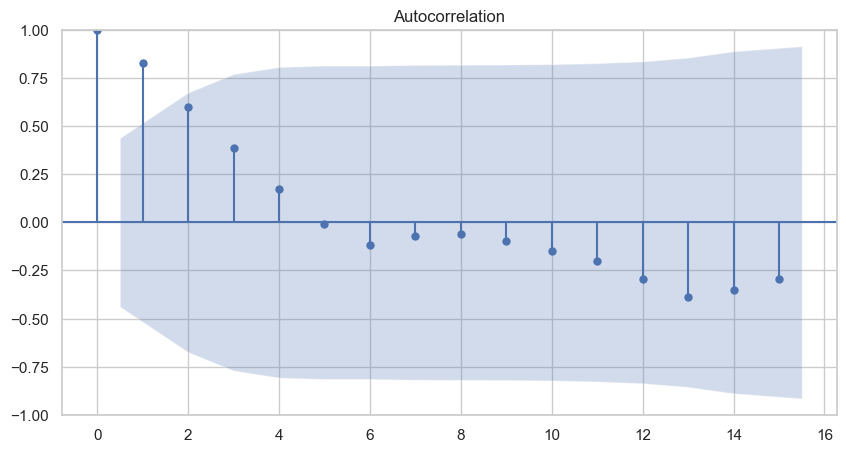

In [28]:
n = 1000 # example number
x = X_test[n]
# plot acf
fig, ax = plt.subplots(figsize=(10, 5))
sm.graphics.tsa.plot_acf(x, lags=15, ax=ax)
plt.show()

# Partial Autocorrelation

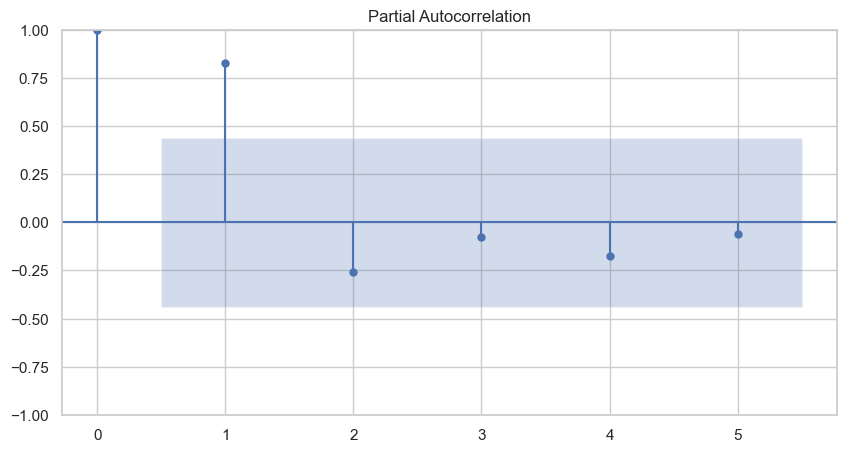

In [29]:
# plot pacf
fig, ax = plt.subplots(figsize=(10, 5))
sm.graphics.tsa.plot_pacf(x, lags=5, ax=ax)
plt.show()

# Correlation Matrix [Throghput with features]

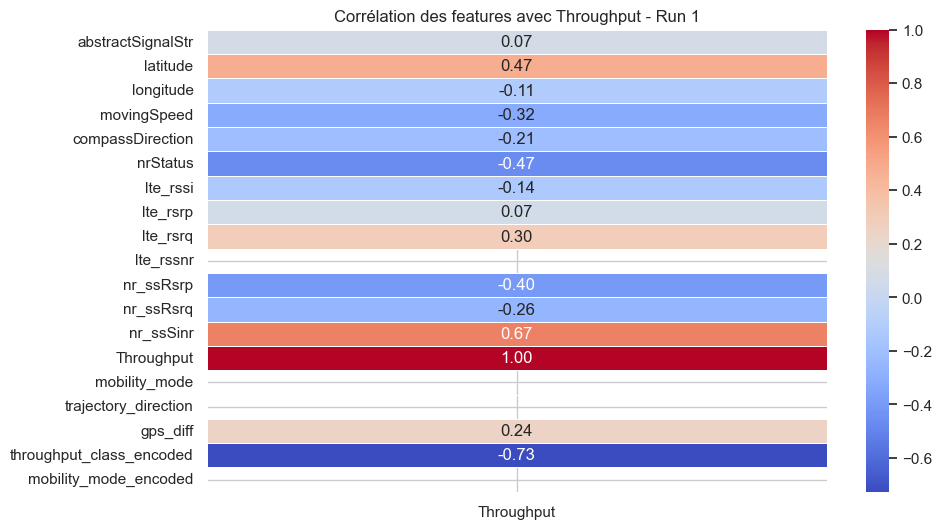

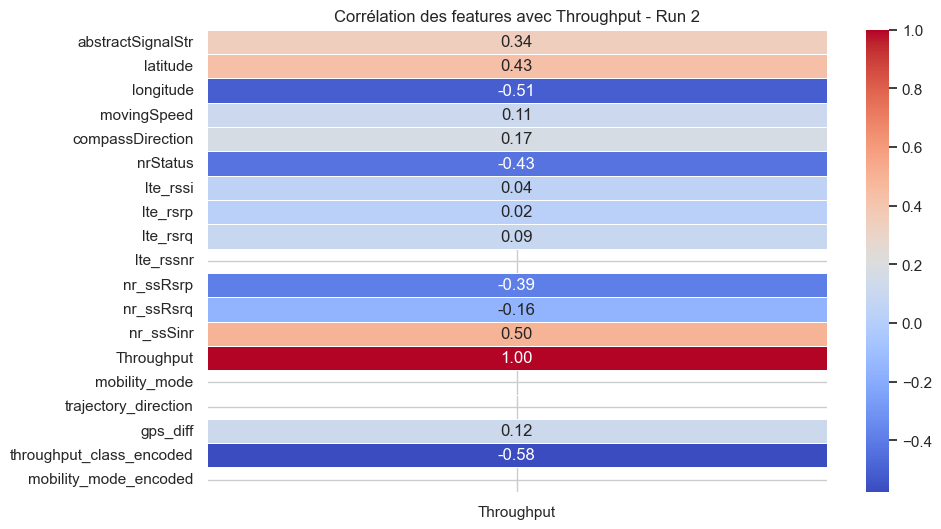

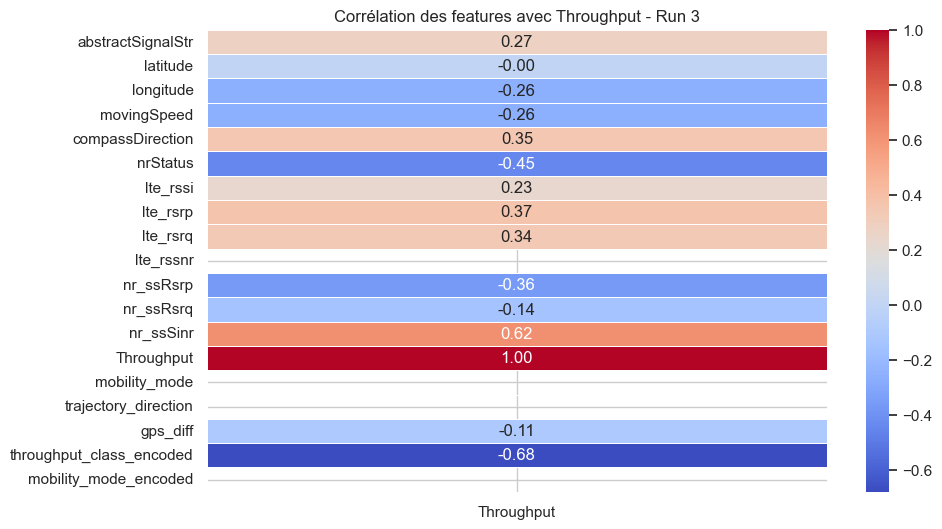

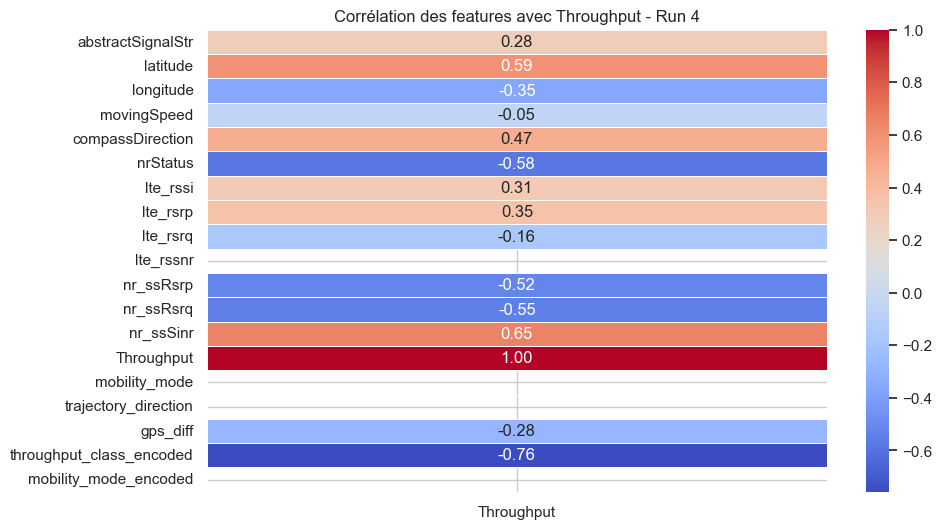

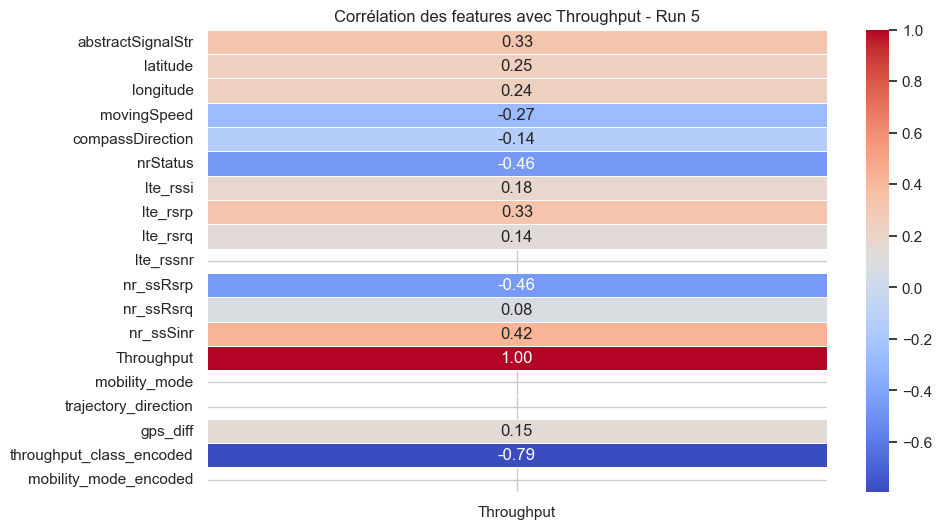

...

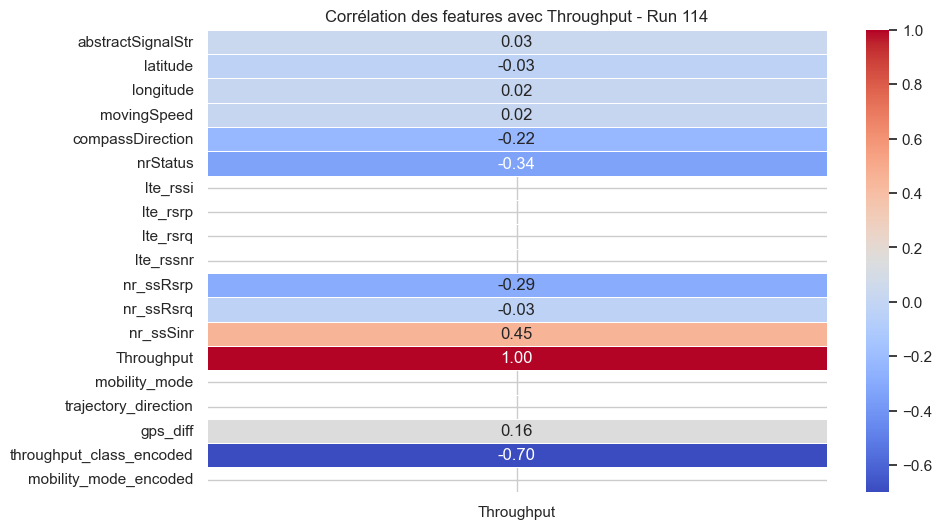

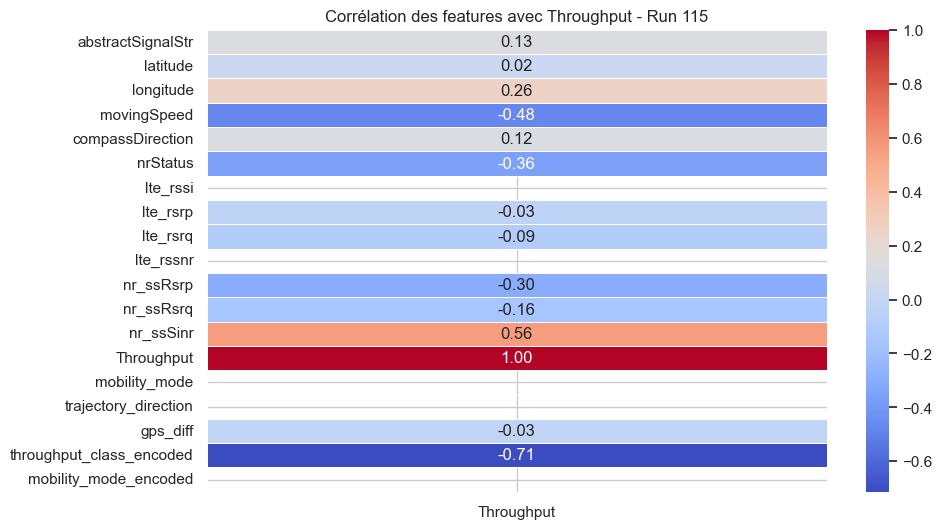

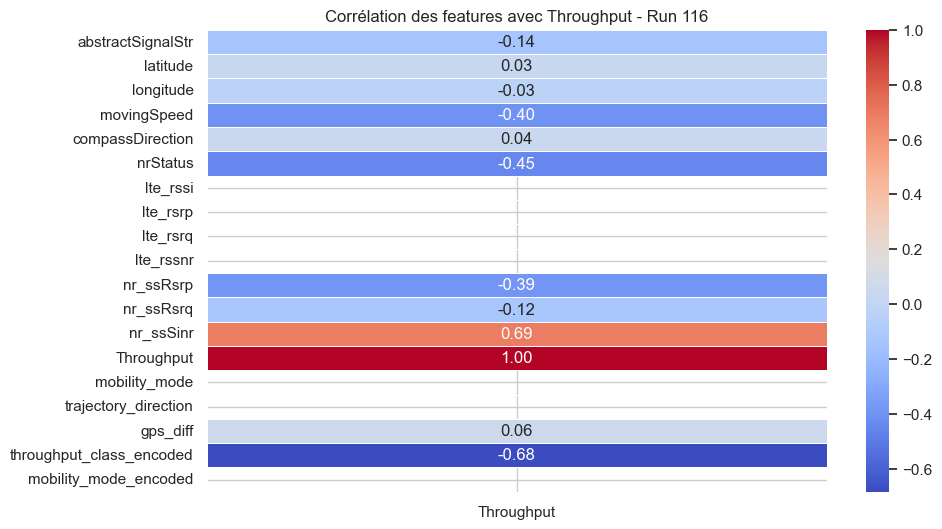

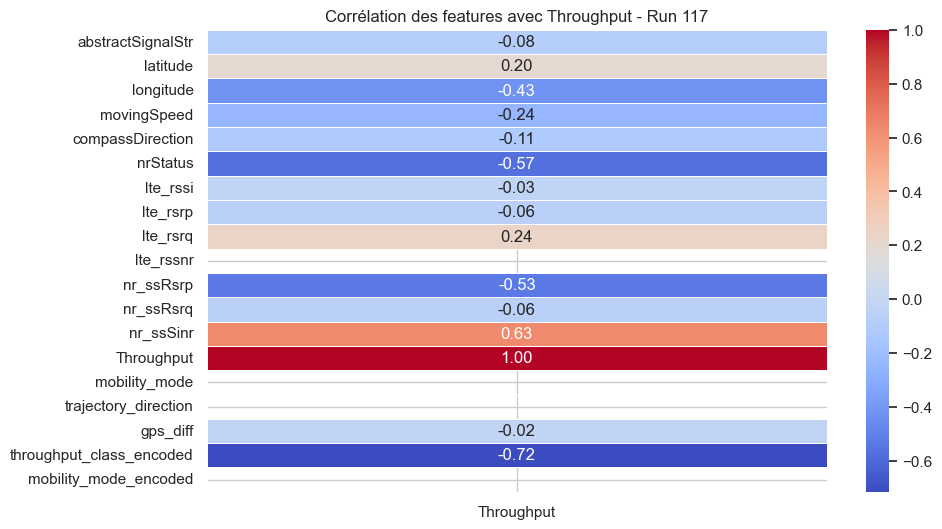

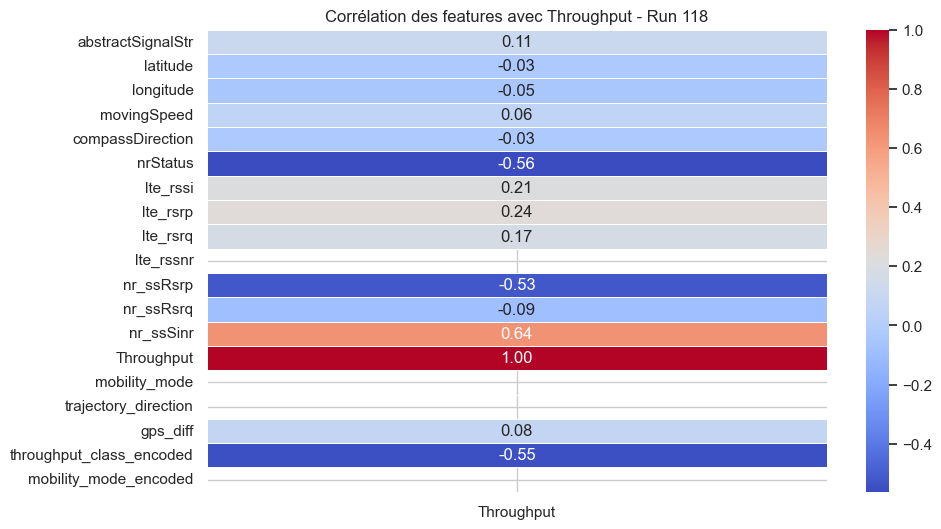

In [30]:
# Charger les données
file_path = "D:\\4DATA\SEMESTER2\PI\DATASET\mmwaves.csv"
dataset = pd.read_csv(file_path)
# Convertir les colonnes catégoriques en variables numériques si nécessaire
dataset_numeric = dataset.select_dtypes(include=['number']).copy()

# Supprimer les colonnes non pertinentes pour la corrélation
dataset_numeric = dataset_numeric.drop(columns=['seq_num', 'tower_id'], errors='ignore')

# Obtenir les valeurs uniques des run_num
run_numbers = dataset_numeric['run_num'].unique()

# Générer et enregistrer une matrice de corrélation pour chaque run_num
for run in run_numbers:
    dataset_run = dataset_numeric[dataset_numeric['run_num'] == run].drop(columns=['run_num'], errors='ignore')
    correlation_matrix = dataset_run.corr()
    
    # Sauvegarde de la heatmap de corrélation
    plt.figure(figsize=(10, 6))
    sns.heatmap(correlation_matrix[['Throughput']], annot=True, fmt=".2f", cmap="coolwarm", linewidths=0.5)
    plt.title(f"Corrélation des features avec Throughput - Run {run}")
    plt.show()
    plt.savefig(f"correlation_run_{run}.png")
    plt.close()
